In [1]:
# Importing the required libraries for visualization 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os 

# Visualization Prefrences.
%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

In [2]:
%pip install xlrd==1.2.0

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


## 01- Data Description Section

In [3]:
# Data Retrieving
excel_file_path = "Data/Dry_Bean_Dataset.xlsx"

df = pd.read_excel(excel_file_path,  sheet_name="Dry_Beans_Dataset")
df.head(8).T

,0,1,2,3,4,5,6,7
Area,28395,28734,29380,30008,30140,30279,30477,30519
Perimeter,610.291,638.018,624.11,645.884,620.134,634.927,670.033,629.727
MajorAxisLength,208.178117,200.524796,212.82613,210.557999,201.847882,212.560556,211.050155,212.996755
MinorAxisLength,173.888747,182.734419,175.931143,182.516516,190.279279,181.510182,184.03905,182.737204
AspectRation,1.197191,1.097356,1.209713,1.153638,1.060798,1.171067,1.146768,1.165591
Eccentricity,0.549812,0.411785,0.562727,0.498616,0.33368,0.520401,0.489478,0.51376
ConvexArea,28715,29172,29690,30724,30417,30600,30970,30847
EquivDiameter,190.141097,191.27275,193.410904,195.467062,195.896503,196.347702,196.988633,197.12432
Extent,0.763923,0.783968,0.778113,0.782681,0.773098,0.775688,0.762402,0.770682
Solidity,0.988856,0.984986,0.989559,0.976696,0.990893,0.98951,0.984081,0.989367


In [4]:
df.shape

(13611, 17)

In [5]:
# Extract Descriptive Data.
pd.set_option("display.float", "{:.2f}".format)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13611.00,53048.28,29324.10,20420.00,36328.00,44652.00,61332.00,254616.00
Perimeter,13611.00,855.28,214.29,524.74,703.52,794.94,977.21,1985.37
MajorAxisLength,13611.00,320.14,85.69,183.60,253.30,296.88,376.50,738.86
MinorAxisLength,13611.00,202.27,44.97,122.51,175.85,192.43,217.03,460.20
AspectRation,13611.00,1.58,0.25,1.02,1.43,1.55,1.71,2.43
Eccentricity,13611.00,0.75,0.09,0.22,0.72,0.76,0.81,0.91
ConvexArea,13611.00,53768.20,29774.92,20684.00,36714.50,45178.00,62294.00,263261.00
EquivDiameter,13611.00,253.06,59.18,161.24,215.07,238.44,279.45,569.37
Extent,13611.00,0.75,0.05,0.56,0.72,0.76,0.79,0.87
Solidity,13611.00,0.99,0.00,0.92,0.99,0.99,0.99,0.99


## 02- Exploratory Data Analysis (EDA) & Feature Engineering Section 

In [6]:
# Check for Null Values
df.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [7]:
df.dtypes

Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object

          Class
DERMASON   3546
SIRA       2636
SEKER      2027
HOROZ      1928
CALI       1630
BARBUNYA   1322
BOMBAY      522


<Axes: title={'center': 'Bean Classes Counts'}>

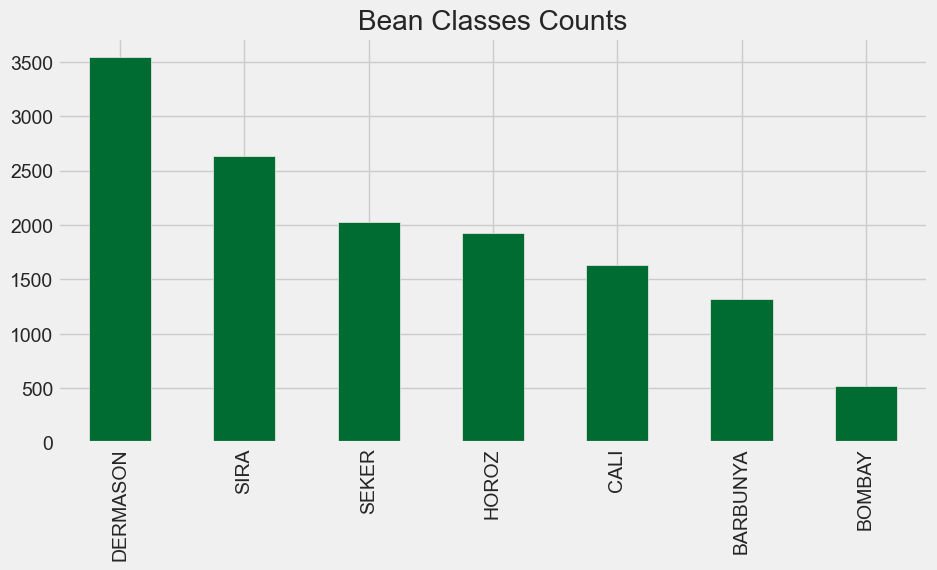

In [8]:
df_class_counts = df.Class.value_counts().to_frame()
print(df_class_counts)
df.Class.value_counts().plot(kind="bar", color='#006C31', figsize=(10,5), title = 'Bean Classes Counts')

In [9]:
# Check the percentage of each class 
df_class_perc = df.Class.value_counts(normalize=True).to_frame()
df_class_perc["Class"] = df_class_perc["Class"] * 100 
df_class_perc.rename(columns = {"Class": "Class%"}, inplace=True)
df_class_perc

,Class%
DERMASON,26.05
SIRA,19.37
SEKER,14.89
HOROZ,14.17
CALI,11.98
BARBUNYA,9.71
BOMBAY,3.84


/var/folders/n2/ss8y1y2d7nqg929tn12_46rc0000gn/T/ipykernel_42533/1694746944.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


(16.5, -0.5)

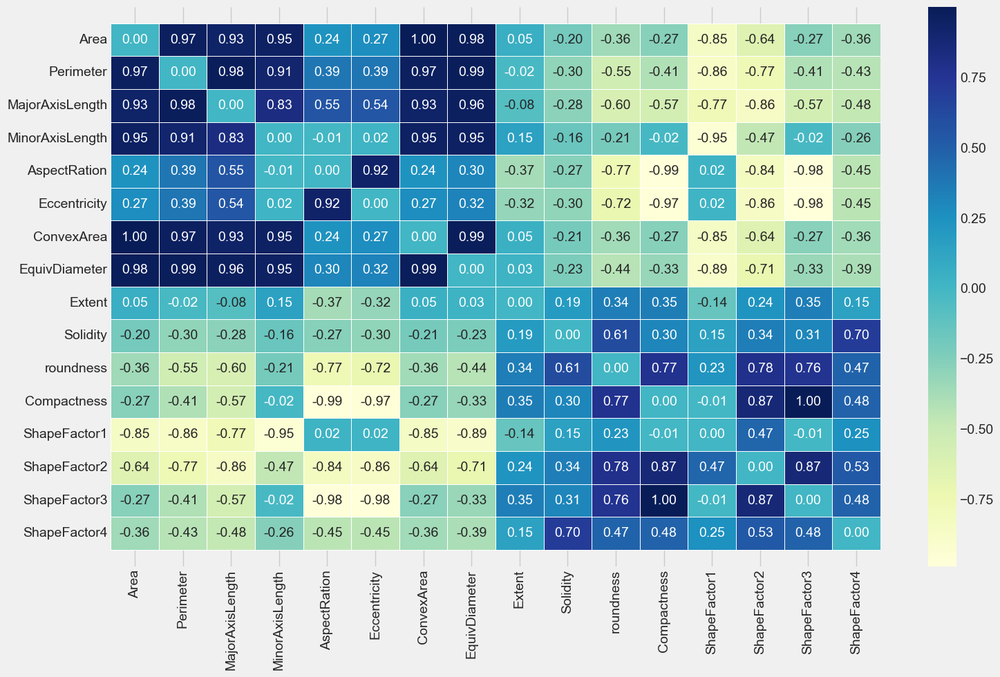

In [10]:
# Studying the correlations between features using Heat Map!
corr_matrix = df.corr()
for x in range(corr_matrix.shape[0]):
    corr_matrix.iloc[x,x] = 0.0

fig, ax = plt.subplots(figsize=(16, 10))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [11]:
# The correlation matrix
corr_mat = df.corr()

# Strip out the diagonal values for the next step
for x in range(corr_mat.shape[0]):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

/var/folders/n2/ss8y1y2d7nqg929tn12_46rc0000gn/T/ipykernel_42533/1062077277.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_mat = df.corr()


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,0.00,0.97,0.93,0.95,0.24,0.27,1.00,0.98,0.05,-0.20,-0.36,-0.27,-0.85,-0.64,-0.27,-0.36
Perimeter,0.97,0.00,0.98,0.91,0.39,0.39,0.97,0.99,-0.02,-0.30,-0.55,-0.41,-0.86,-0.77,-0.41,-0.43
MajorAxisLength,0.93,0.98,0.00,0.83,0.55,0.54,0.93,0.96,-0.08,-0.28,-0.60,-0.57,-0.77,-0.86,-0.57,-0.48
MinorAxisLength,0.95,0.91,0.83,0.00,-0.01,0.02,0.95,0.95,0.15,-0.16,-0.21,-0.02,-0.95,-0.47,-0.02,-0.26
AspectRation,0.24,0.39,0.55,-0.01,0.00,0.92,0.24,0.30,-0.37,-0.27,-0.77,-0.99,0.02,-0.84,-0.98,-0.45
Eccentricity,0.27,0.39,0.54,0.02,0.92,0.00,0.27,0.32,-0.32,-0.30,-0.72,-0.97,0.02,-0.86,-0.98,-0.45
ConvexArea,1.00,0.97,0.93,0.95,0.24,0.27,0.00,0.99,0.05,-0.21,-0.36,-0.27,-0.85,-0.64,-0.27,-0.36
EquivDiameter,0.98,0.99,0.96,0.95,0.30,0.32,0.99,0.00,0.03,-0.23,-0.44,-0.33,-0.89,-0.71,-0.33,-0.39
Extent,0.05,-0.02,-0.08,0.15,-0.37,-0.32,0.05,0.03,0.00,0.19,0.34,0.35,-0.14,0.24,0.35,0.15
Solidity,-0.20,-0.30,-0.28,-0.16,-0.27,-0.30,-0.21,-0.23,0.19,0.00,0.61,0.30,0.15,0.34,0.31,0.70


In [12]:
# Pairwise maximal correlations 
corr_max  = corr_mat.abs().max().to_frame()
corr_id_max = corr_mat.abs().idxmax().to_frame()

# dataframe aggrigation and processing
pair_features_corr = pd.merge(corr_id_max, corr_max, on = corr_max.index)
pair_features_corr = pair_features_corr.rename(columns = {'key_0':'Feature_one', '0_x':'Feature_two', '0_y':'correlation'})\
                                                .sort_values('correlation', ascending=False)\
                                                .reset_index().drop('index', axis=1)
pair_features_corr


,Feature_one,Feature_two,correlation
0,Area,ConvexArea,1.00
1,ConvexArea,Area,1.00
2,Compactness,ShapeFactor3,1.00
3,ShapeFactor3,Compactness,1.00
4,Perimeter,EquivDiameter,0.99
5,EquivDiameter,Perimeter,0.99
6,AspectRation,Compactness,0.99
7,Eccentricity,ShapeFactor3,0.98
8,MajorAxisLength,Perimeter,0.98
9,MinorAxisLength,Area,0.95


/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


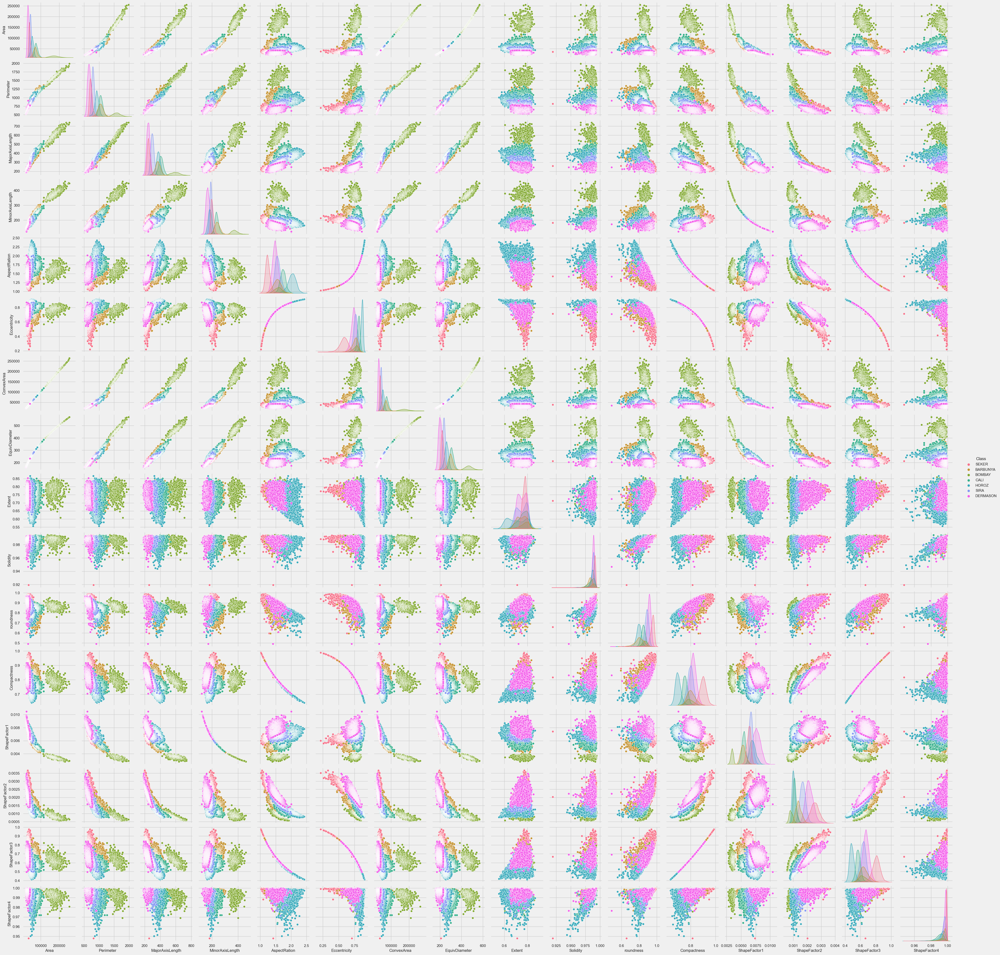

In [13]:
float_columns = [col for col in df.columns if col != 'Class']

sns.set_context('notebook')
sns.pairplot(df[float_columns + ['Class']], 
             hue='Class'
             );
### END SOLUTION

And an examination of the skew values in anticipation of transformations.
- 0 : no skew
- pos : right skew
- neg : left skew

In [14]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns

/var/folders/n2/ss8y1y2d7nqg929tn12_46rc0000gn/T/ipykernel_42533/3502395792.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skew_columns = (df


,skewness_value
Area,2.95
ConvexArea,2.94
MinorAxisLength,2.24
EquivDiameter,1.95
Perimeter,1.63
MajorAxisLength,1.36
AspectRation,0.58
ShapeFactor2,0.30
ShapeFactor3,0.24
Compactness,0.04


In [15]:
skew_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_columns = skew_columns.query('skewness_value > 0.75')
skew_columns

/var/folders/n2/ss8y1y2d7nqg929tn12_46rc0000gn/T/ipykernel_42533/420837296.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skew_columns = (df


,skewness_value
Area,2.95
ConvexArea,2.94
MinorAxisLength,2.24
EquivDiameter,1.95
Perimeter,1.63
MajorAxisLength,1.36


In [16]:
# Perform log transform on skewed columns
for col in skew_columns['skewness_value'].index.tolist():
    df[col] = np.log1p(df[col]) 

In [17]:
skew_trans_columns = (df
                .skew()
                .sort_values(ascending=False)).to_frame("skewness_value")
skew_trans_columns

/var/folders/n2/ss8y1y2d7nqg929tn12_46rc0000gn/T/ipykernel_42533/2565272234.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skew_trans_columns = (df


,skewness_value
MinorAxisLength,1.31
EquivDiameter,1.07
Area,1.07
ConvexArea,1.07
Perimeter,0.84
MajorAxisLength,0.63
AspectRation,0.58
ShapeFactor2,0.30
ShapeFactor3,0.24
Compactness,0.04


In [18]:
df.dtypes

Area               float64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea         float64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object

In [19]:
df.head(7)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,10.25,6.42,5.34,5.16,1.20,0.55,10.27,5.25,0.76,0.99,0.96,0.91,0.01,0.00,0.83,1.00,SEKER
1,10.27,6.46,5.31,5.21,1.10,0.41,10.28,5.26,0.78,0.98,0.89,0.95,0.01,0.00,0.91,1.00,SEKER
2,10.29,6.44,5.37,5.18,1.21,0.56,10.30,5.27,0.78,0.99,0.95,0.91,0.01,0.00,0.83,1.00,SEKER
3,10.31,6.47,5.35,5.21,1.15,0.50,10.33,5.28,0.78,0.98,0.90,0.93,0.01,0.00,0.86,0.99,SEKER
4,10.31,6.43,5.31,5.25,1.06,0.33,10.32,5.28,0.77,0.99,0.98,0.97,0.01,0.00,0.94,1.00,SEKER
5,10.32,6.46,5.36,5.21,1.17,0.52,10.33,5.28,0.78,0.99,0.94,0.92,0.01,0.00,0.85,1.00,SEKER
6,10.32,6.51,5.36,5.22,1.15,0.49,10.34,5.29,0.76,0.98,0.85,0.93,0.01,0.00,0.87,1.00,SEKER


In [20]:
from sklearn.preprocessing import StandardScaler
float_columns = [col for col in df.columns if col != 'Class']
sc = StandardScaler()
df[float_columns] = sc.fit_transform(df[float_columns])
df.head(7)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,-1.28,-1.38,-1.63,-0.68,-1.57,-2.19,-1.28,-1.28,0.29,0.37,1.42,1.84,0.68,2.40,1.93,0.84,SEKER
1,-1.25,-1.19,-1.78,-0.43,-1.97,-3.69,-1.24,-1.25,0.70,-0.46,0.23,2.50,0.37,3.10,2.69,0.77,SEKER
2,-1.20,-1.28,-1.54,-0.62,-1.51,-2.05,-1.20,-1.20,0.58,0.52,1.25,1.76,0.60,2.24,1.84,0.92,SEKER
3,-1.15,-1.13,-1.58,-0.43,-1.74,-2.74,-1.12,-1.15,0.67,-2.24,0.52,2.08,0.40,2.52,2.20,-0.20,SEKER
4,-1.14,-1.31,-1.75,-0.21,-2.12,-4.54,-1.14,-1.14,0.48,0.80,1.87,2.77,0.12,3.27,3.01,0.94,SEKER
5,-1.12,-1.21,-1.54,-0.46,-1.67,-2.51,-1.13,-1.12,0.53,0.51,1.19,2.01,0.40,2.41,2.12,0.96,SEKER
6,-1.11,-0.97,-1.57,-0.39,-1.77,-2.84,-1.10,-1.11,0.26,-0.66,-0.34,2.16,0.32,2.56,2.30,0.91,SEKER


## 03- Machine Learning Section : clusterning methods 


### 1- K-means Algorithm

In [21]:
### BEGIN SOLUTION
from sklearn.cluster import KMeans

# Create and fit a range of models
km_list = list()

for clust in range(1,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df[float_columns])
    
    km_list.append(pd.Series({'clusters': clust, 
                              'inertia': km.inertia_,
                              'model': km}))




/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: 

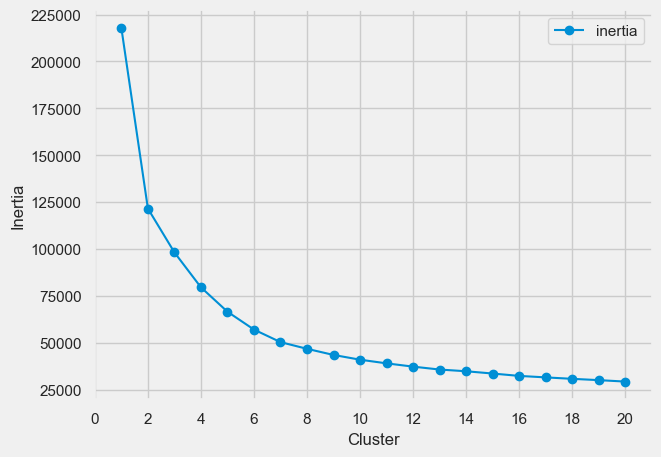

In [22]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

In [23]:
Bean_classes = pd.merge(df_class_counts, df_class_perc, on = df_class_counts.index)
Bean_classes.rename(columns={'key_0':'class_name'}, inplace=True)
Bean_classes

,class_name,Class,Class%
0,DERMASON,3546,26.05
1,SIRA,2636,19.37
2,SEKER,2027,14.89
3,HOROZ,1928,14.17
4,CALI,1630,11.98
5,BARBUNYA,1322,9.71
6,BOMBAY,522,3.84


In [24]:
### BEGIN SOLUTION
km = KMeans(n_clusters=8, random_state=42)
km = km.fit(df[float_columns])
df['k-means'] = km.predict(df[float_columns])
df.sample(7)

/Users/shinichisato/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,k-means
189,-0.82,-0.84,-1.23,-0.21,-1.53,-2.09,-0.82,-0.82,0.27,-0.09,0.54,1.79,0.12,1.88,1.86,0.77,SEKER,0
12603,-0.77,-0.66,-0.41,-1.11,0.69,0.77,-0.75,-0.77,-1.48,-1.24,-0.35,-0.77,1.29,-0.22,-0.78,-0.69,DERMASON,6
51,-0.97,-1.09,-1.35,-0.37,-1.53,-2.08,-0.98,-0.97,0.64,0.78,1.33,1.79,0.30,2.02,1.87,1.06,SEKER,0
7017,0.52,0.69,1.01,-0.18,1.99,1.36,0.51,0.52,1.08,0.60,-1.41,-1.73,0.10,-1.29,-1.65,0.10,HOROZ,3
953,-0.52,-0.65,-0.85,-0.04,-1.23,-1.38,-0.52,-0.52,0.65,0.55,1.17,1.35,-0.07,1.20,1.38,0.84,SEKER,0
11860,-0.99,-1.02,-0.91,-0.96,-0.31,-0.03,-0.99,-0.99,0.17,0.09,0.70,0.21,1.06,0.63,0.17,0.04,DERMASON,4
1802,-0.12,-0.31,-0.42,0.26,-0.98,-0.91,-0.13,-0.12,0.56,1.14,1.34,1.02,-0.40,0.62,1.02,0.82,SEKER,0


In [25]:
# Group by Class and K-means for comparsion between clustered classes and actual classes 
(df[['Class','k-means']]
 .groupby(['Class','k-means'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))
### END SOLUTION


number
Class    k-means        
BARBUNYA 0             6
         1           221
         3             8
         5            25
         6            60
         7          1002
BOMBAY   2           520
         5             2
CALI     0             2
         1          1354
         2             1
         3             9
         5           228
         6            12
         7            24
DERMASON 0           114
         3             5
         4          2726
         5             7
         6           694
HOROZ    1            69
         3          1629
         4             3
         5           180
         6            47
SEKER    0          1875
         4            13
         5             2
         6           125
         7            12
SIRA     0            22
         1            17
         3            78
         4            68
         5            24
         6          2421
         7             6

### 2- Agglomerative Algorithm 

In [26]:
from sklearn.cluster import AgglomerativeClustering
### BEGIN SOLUTION
ag = AgglomerativeClustering(n_clusters=7, linkage='ward', compute_full_tree=True)
ag = ag.fit(df[float_columns])
df['agglom'] = ag.fit_predict(df[float_columns])

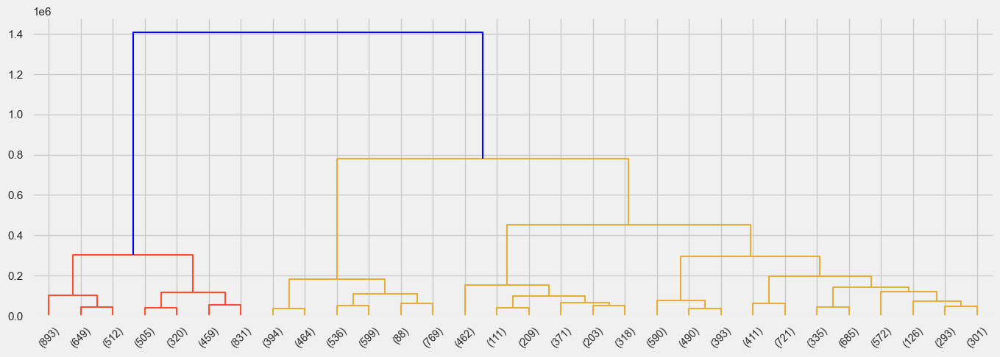

In [27]:
# First, we import the cluster hierarchy module from SciPy (described above) to obtain the linkage and dendrogram functions.
from scipy.cluster import hierarchy

Z = hierarchy.linkage(ag.children_, method='ward')

fig, ax = plt.subplots(figsize=(15,5))

den = hierarchy.dendrogram(Z, orientation='top', 
                           p=30, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax,
                           above_threshold_color='blue')
### END SOLUTION

In [28]:
# First, for Agglomerative Clustering:
(df[['Class','agglom']]
 .groupby(['Class','agglom'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
Class    agglom        
BARBUNYA 0         1273
         1            2
         2           32
         3            6
         5            8
         6            1
BOMBAY   4          522
CALI     0         1572
         1           32
         2           18
         3            2
         6            6
DERMASON 0            1
         1            1
         2          494
         3           80
         5         2969
         6            1
HOROZ    0           52
         1         1602
         2          167
         5           12
         6           95
SEKER    0            7
         2           60
         3         1879
         5           80
         6            1
SIRA     0           22
         1           33
         2         2252
         3           57
         5          266
         6            6

### 3- MeanShift Algorithm 


In [29]:
from sklearn.cluster import MeanShift
ms  = MeanShift(bandwidth=2.8, n_jobs=-1) 
ms = ms.fit(df[float_columns])

In [30]:
np.unique(ms.labels_)

array([0, 1, 2, 3, 4])

In [31]:
df['MeanShift'] = ms.fit_predict(df[float_columns])

In [32]:
(df[['Class','MeanShift']]
 .groupby(['Class','MeanShift'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
Class    MeanShift        
BARBUNYA 0             974
         1             346
         2               1
         4               1
BOMBAY   1             508
         2              14
CALI     0             891
         1             710
         2              29
DERMASON 0            3539
         4               7
HOROZ    0            1864
         1               3
         2              22
         3               4
         4              35
SEKER    0            2026
         3               1
SIRA     0            2636

### 4- DBSCAN Algorithm 


In [33]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps=0.5, min_samples=11, metric='euclidean')
dbs = dbs.fit(df[float_columns])

In [34]:
np.unique(dbs.labels_)

array([-1,  0,  1,  2,  3,  4,  5,  6])

In [35]:
df['dbscan'] = dbs.fit_predict(df[float_columns])

In [36]:
# First, for Agglomerative Clustering:
(df[['Class','dbscan']]
 .groupby(['Class','dbscan'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

number
Class    dbscan        
BARBUNYA -1        1319
          0           3
BOMBAY   -1         522
CALI     -1        1589
          0           4
          1          37
DERMASON -1        1264
          0        2277
          6           5
HOROZ    -1        1869
          0           8
          2          11
          3          30
          4           8
          5           1
          6           1
SEKER    -1         410
          0        1617
SIRA     -1        1048
          0        1578
          5           9
          6           1